In [41]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv2

In [2]:
from patchify import patchify
import PIL
import matplotlib.pyplot as plt
PIL.Image.MAX_IMAGE_PIXELS = 933120000

In [3]:
tif_map = PIL.Image.open("./maps/map1.tif")
tif_map_np = np.array(tif_map)

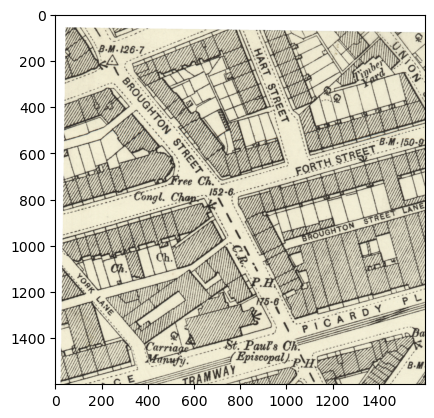

In [4]:
fig, ax = plt.subplots()
ax.imshow(tif_map_np[400:2000, 900:2500, :])
plt.show()

In [11]:
map_1 = cv.imread("./maps/map1.tif")
map_2 = cv.imread("./maps/map2.tif")
map_3 = cv.imread("./maps/map3.tif")
map_4 = cv.imread("./maps/map4.tif")

In [7]:
def show_map(img):
    fig, ax = plt.subplots(figsize = (20,10))
    ax.imshow(img)
    plt.show()
def rotate_crop_map(map_img):
    gray = cv.cvtColor(map_img, cv.COLOR_RGB2GRAY)
    gray = 255 - gray
    thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]

    # Compute rotated bounding box
    coords = np.column_stack(np.where(thresh > 0))
    center_rect, dims, angle = cv.minAreaRect(coords)

    if angle < -45:
        angle = -angle
    else:
        angle = 90-angle
    print(angle)

    # Rotate image to deskew
    (h, w) = map_img.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv.warpAffine(map_img, M, (w, h), flags=cv.INTER_CUBIC, borderMode=cv.BORDER_REPLICATE)

    gray = cv.cvtColor(rotated, cv.COLOR_BGR2GRAY)
    gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
    coords = cv.findNonZero(gray) # Find all non-zero points (text)
    x, y, w, h = cv.boundingRect(coords) # Find minimum spanning bounding box
    rect = rotated[y:y+h, x:x+w] 
    rect = cv.cvtColor(rect, cv.COLOR_BGR2RGB)
    
    return rect

0.8036956787109375


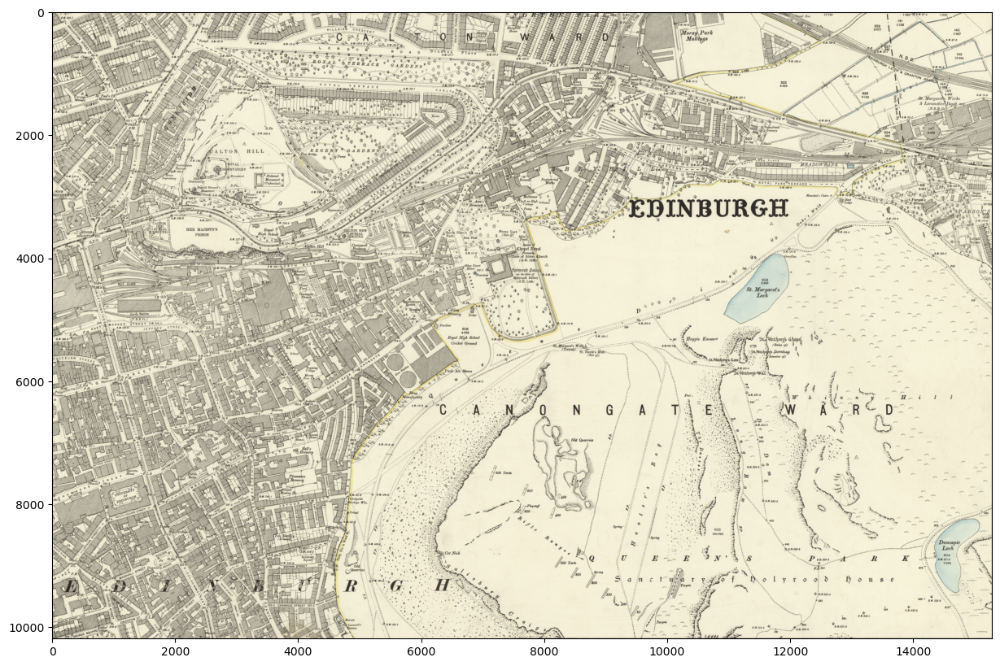

In [8]:
fix_map_1 = rotate_crop_map(map_1)
show_map(fix_map_1)

0.8036727905273438


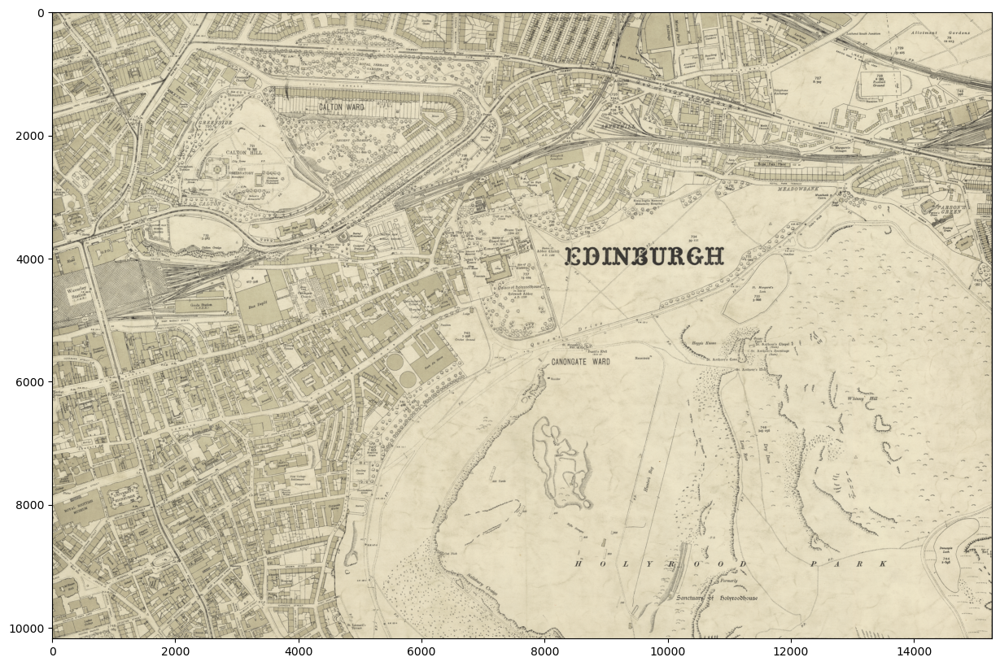

In [10]:
fix_map_2 = rotate_crop_map(map_2)
show_map(fix_map_2)

0.8036727905273438


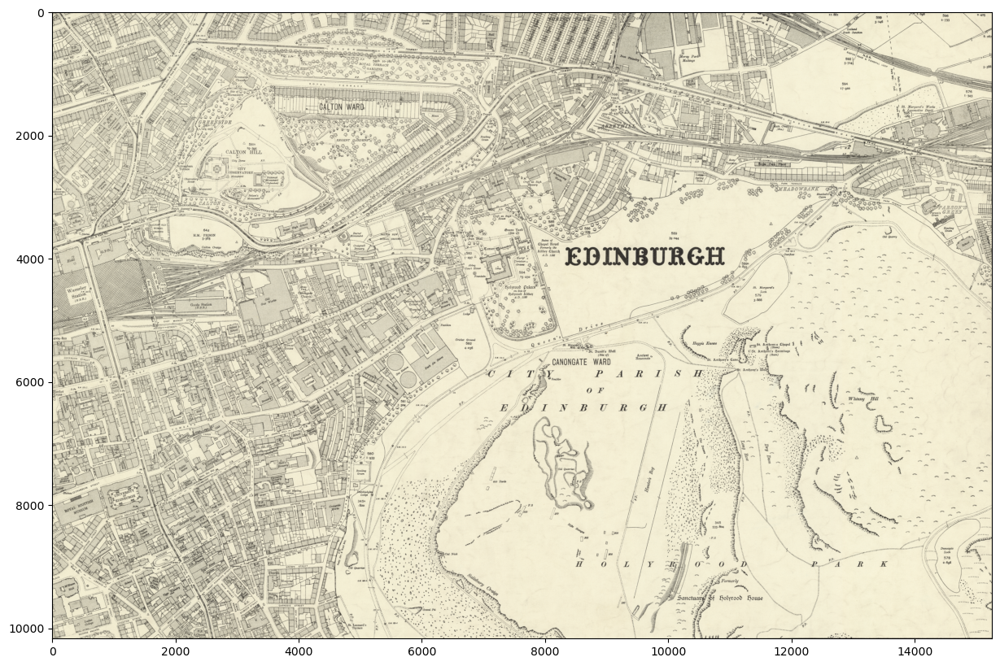

In [12]:
fix_map_3 = rotate_crop_map(map_3)
show_map(fix_map_3)

0.8036727905273438


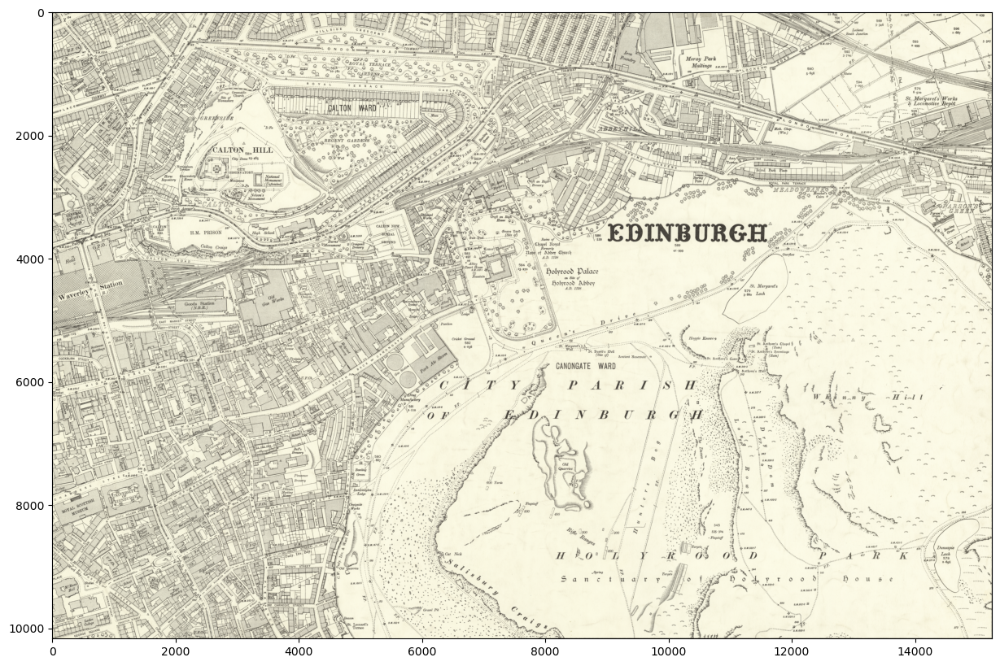

In [13]:
fix_map_4 = rotate_crop_map(map_4)
show_map(fix_map_4)

In [15]:
print(fix_map_1.shape)
print(fix_map_2.shape)
print(fix_map_3.shape)
print(fix_map_4.shape)

(10187, 15281, 3)
(10178, 15266, 3)
(10169, 15254, 3)
(10166, 15249, 3)


In [18]:
cv.imwrite("./rotated_maps/map1.png", fix_map_1)
cv.imwrite("./rotated_maps/map2.png", fix_map_2)
cv.imwrite("./rotated_maps/map3.png", fix_map_3)
cv.imwrite("./rotated_maps/map4.png", fix_map_4)

True

In [20]:
##test for alignment.

In [27]:
patch_width = 64

In [28]:
map_1_patches = patchify(image = fix_map_1, patch_size = (patch_width, patch_width, 3),step = patch_width)
print(f"Patches generated with shape: {map_1_patches.shape}")

Patches generated with shape: (159, 238, 1, 64, 64, 3)


In [30]:
map_2_patches = patchify(image = fix_map_2, patch_size = (patch_width, patch_width, 3),step = patch_width)
print(f"Patches generated with shape: {map_1_patches.shape}")

Patches generated with shape: (159, 238, 1, 64, 64, 3)


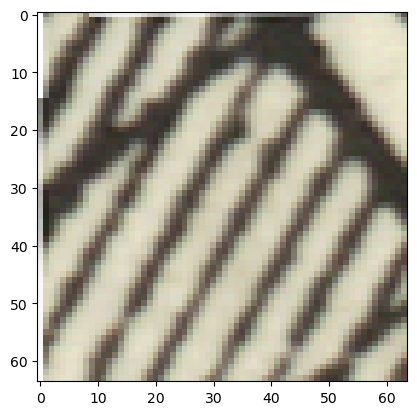

In [79]:
fig, ax = plt.subplots()
ax.imshow(map_1_patches[0, 0, 0])
plt.show()

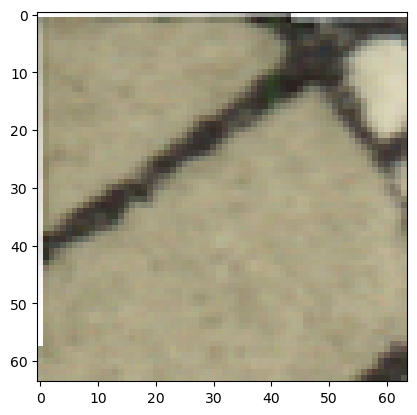

In [80]:
fig, ax = plt.subplots()
ax.imshow(map_2_patches[0, 0, 0])
plt.show()

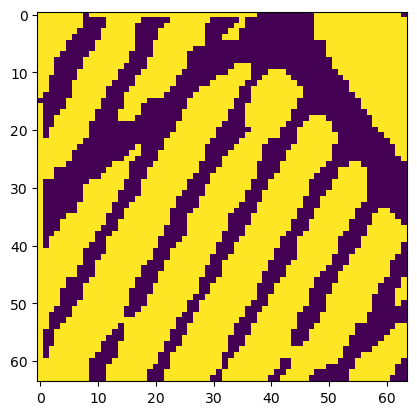

In [90]:
im1 = cv2.cvtColor(map_1_patches[0, 0, 0], cv2.COLOR_BGR2GRAY)
im2 = cv2.cvtColor(map_2_patches[0, 0, 0], cv2.COLOR_BGR2GRAY)

thresh = 128
 
ret,img1 = cv2.threshold(im1, 127, 255,cv2.THRESH_BINARY)
ret,img2 = cv2.threshold(im2, 127, 255,cv2.THRESH_BINARY)
fig, ax = plt.subplots()
ax.imshow(img1)
plt.show()

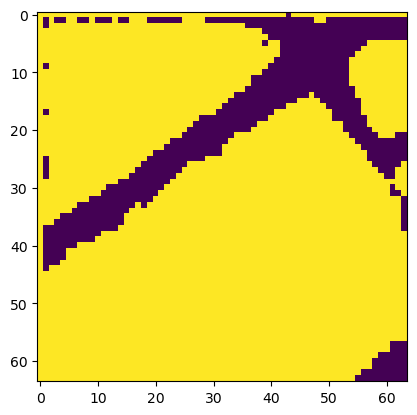

In [74]:
fig, ax = plt.subplots()
ax.imshow(img2)
plt.show()

In [57]:
MAX_FEATURES = 500
GOOD_MATCH_PERCENT = 0.15
 
def alignImages(im1, im2):
 
    # Convert images to grayscale
    im1Gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
    im2Gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)

    # Match features.
    method = cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
    matcher = cv2.DescriptorMatcher_create(method)
    matches = matcher.match(descriptors1, descriptors2, None)

    #Sort matches by score
    matches = sorted(matches, key=lambda x:x.distance)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Draw top matches
    imMatches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)
    cv2.imwrite("matches.jpg", imMatches)

    ptsA = np.zeros((len(matches), 2), dtype="float")
    ptsB = np.zeros((len(matches), 2), dtype="float")
    # loop over the top matches
    for (i, m) in enumerate(matches):
        # indicate that the two keypoints in the respective images
        # map to each other
        ptsA[i] = kpsA[m.queryIdx].pt
        ptsB[i] = kpsB[m.trainIdx].pt

      # Find homography
    (H, mask) = cv2.findHomography(ptsA, ptsB, method=cv2.RANSAC)
    # use the homography matrix to align the images
    (h, w) = template.shape[:2]
    aligned = cv2.warpPerspective(image, H, (w, h))
    # return the aligned image
    return aligned
 



In [58]:
_ = alignImages(map_1_patches[0, 0, 0], map_2_patches[0, 0, 0])

error: OpenCV(4.6.0) C:\b\abs_74oeeuevib\croots\recipe\opencv-suite_1664548340488\work\modules\calib3d\src\fundam.cpp:385: error: (-28:Unknown error code -28) The input arrays should have at least 4 corresponding point sets to calculate Homography in function 'cv::findHomography'


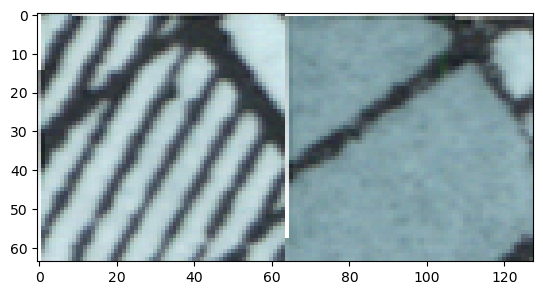

(<matplotlib.image.AxesImage at 0x273007c10f0>, None)

In [55]:
# img1 = cv.imread('box.png',cv.IMREAD_GRAYSCALE)          # queryImage
# img2 = cv.imread('box_in_scene.png',cv.IMREAD_GRAYSCALE) # trainImage
# Initiate SIFT detector
sift = cv.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(im1,None)
kp2, des2 = sift.detectAndCompute(im2,None)
# BFMatcher with default params
bf = cv.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])
# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv.drawMatchesKnn(im1,kp1,im2,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()

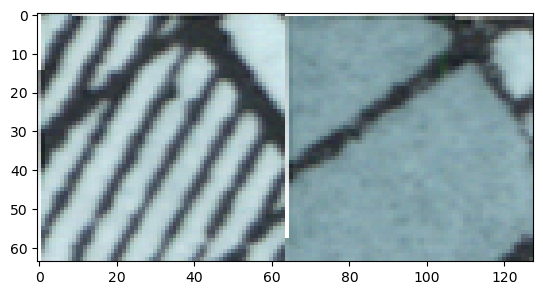

(<matplotlib.image.AxesImage at 0x2730070b460>, None)

In [56]:
img1 = cv.cvtColor(map_1_patches[0, 0, 0], cv.COLOR_BGR2RGB)
img2 = cv.cvtColor(map_2_patches[0, 0, 0], cv.COLOR_BGR2RGB)
# Initiate ORB detector
orb = cv.ORB_create()
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
# create BFMatcher object
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
# Match descriptors.
matches = bf.match(des1,des2)
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)
# Draw first 10 matches.
img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()

In [87]:
img = cv.imread('./maps/map1.tif')

# 
grayImg = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

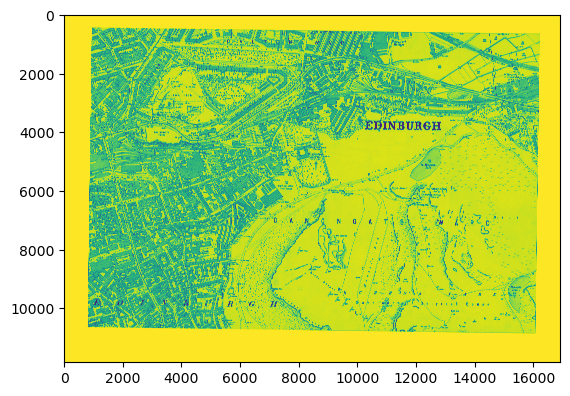

In [91]:
fig, ax = plt.subplots()
ax.imshow(grayImg)
plt.show()

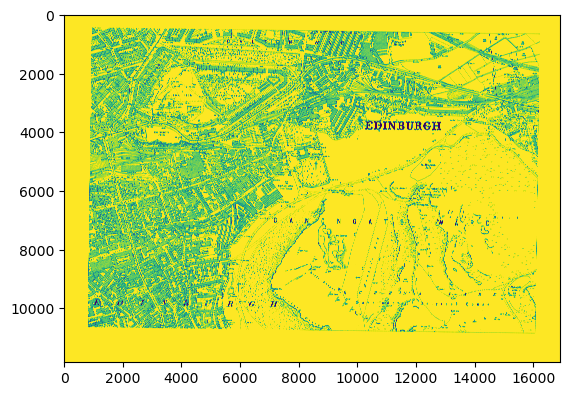

In [89]:

# 
ret, thresh = cv.threshold(grayImg, 127, 255,cv.THRESH_BINARY)
fig, ax = plt.subplots()
ax.imshow(thresh)
plt.show()

In [ ]:
import numpy as np
import cv2 as cv

float_img = cv.imread('img/float.jpg', cv.IMREAD_GRAYSCALE)
ref_img = cv.imread('img/ref.jpg', cv.IMREAD_GRAYSCALE)

akaze = cv.AKAZE_create()
float_kp, float_des = akaze.detectAndCompute(float_img, None)
ref_kp, ref_des = akaze.detectAndCompute(ref_img, None)

bf = cv.BFMatcher()
matches = bf.knnMatch(float_des, ref_des, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append([m])

#Choose the right key point
ref_matched_kpts = np.float32(
    [float_kp[m[0].queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
sensed_matched_kpts = np.float32(
    [ref_kp[m[0].trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

#Calculate homography
H, status = cv.findHomography(
    ref_matched_kpts, sensed_matched_kpts, cv.RANSAC, 5.0)

#Convert image
warped_image = cv.warpPerspective(
    float_img, H, (float_img.shape[1], float_img.shape[0]))

cv.imwrite('warped.jpg', warped_image)